In [75]:
import pandas as pd
from IPython.display import display
tweets = pd.read_csv('grounded.csv', header=None, encoding='latin1')
tweets.head(5)

,0,1,2,3,4,5,6,7
0,8.395500e+17,8.3955E+17,@PressSec sounds so defensive &amp; combative...,Wed Mar 08 18:55:54 +0000 2017,False,0.0,0.0,False
1,8.395500e+17,8.39497E+17,RT @daveweigel: Hypocrisy and politics go hand...,Wed Mar 08 15:24:03 +0000 2017,True,2543.0,0.0,True
2,8.395500e+17,8.39497E+17,RT @DavidCornDC: This may be outrageous. It is...,Wed Mar 08 15:23:30 +0000 2017,True,1412.0,0.0,True
3,8.395500e+17,8.39497E+17,RT @DavidCornDC: If only we could catch Trump ...,Wed Mar 08 15:23:08 +0000 2017,True,2290.0,0.0,True
4,8.395460e+17,8.39546E+17,#Cheers &amp; #Happy #InternationalWomensDay f...,Wed Mar 08 18:38:51 +0000 2017,False,0.0,3.0,True


In [76]:
# adding column name to the respective columns 
tweets.columns =['id1', 'id2', 'sentence', 'created_at', 'tf1', 'fl1', 'fl2', 'tf2'] 

# displaying the DataFrame 
display(tweets.head(5))

# Remove column name except 'sentence'  
tweets2 = tweets.drop(['id1', 'id2', 'created_at', 'tf1', 'fl1', 'fl2', 'tf2'], 
                       axis = 1) 
# show the dataframe 
display(tweets2.head(5))

,id1,id2,sentence,created_at,tf1,fl1,fl2,tf2
0,8.395500e+17,8.3955E+17,@PressSec sounds so defensive &amp; combative...,Wed Mar 08 18:55:54 +0000 2017,False,0.0,0.0,False
1,8.395500e+17,8.39497E+17,RT @daveweigel: Hypocrisy and politics go hand...,Wed Mar 08 15:24:03 +0000 2017,True,2543.0,0.0,True
2,8.395500e+17,8.39497E+17,RT @DavidCornDC: This may be outrageous. It is...,Wed Mar 08 15:23:30 +0000 2017,True,1412.0,0.0,True
3,8.395500e+17,8.39497E+17,RT @DavidCornDC: If only we could catch Trump ...,Wed Mar 08 15:23:08 +0000 2017,True,2290.0,0.0,True
4,8.395460e+17,8.39546E+17,#Cheers &amp; #Happy #InternationalWomensDay f...,Wed Mar 08 18:38:51 +0000 2017,False,0.0,3.0,True


,sentence
0,@PressSec sounds so defensive &amp; combative...
1,RT @daveweigel: Hypocrisy and politics go hand...
2,RT @DavidCornDC: This may be outrageous. It is...
3,RT @DavidCornDC: If only we could catch Trump ...
4,#Cheers &amp; #Happy #InternationalWomensDay f...


In [77]:
# view the shape of the data (the number of rows and columns)
print(f"The shape of the data is: {tweets2.shape}")

# view the data with the "tweet" column widened to 800px 
# so that the full tweet is displayed,
# and hide the index column
tweets2\
.style.set_properties(subset=['sentence'], **{'width': '800px'})\
.hide_index()

The shape of the data is: (22890, 1)


In [78]:
# let's find out how many tweets contain a hashtag
tweets_with_hashtags = tweets2.loc[tweets2["sentence"].str.contains("#")]

# view the number of tweets that contain a hashtag
print(f"Number of tweets containing hashtags: {len(tweets_with_hashtags)}")

# view the tweets that contain a hashtag
tweets_with_hashtags\
.style.set_properties(subset=['sentence'], **{'width': '800px'}).hide_index()  

Number of tweets containing hashtags: 8306


In [79]:
tweets_with_hashtags

,sentence
0,@PressSec sounds so defensive &amp; combative...
4,#Cheers &amp; #Happy #InternationalWomensDay f...
5,#happy #wednesday #evening with #fashion #eleg...
6,#happy #wednesday #evening with #fashion #eleg...
7,#happy #wednesday #evening with #fashion #eleg...
...,...
22876,@SenSanders @JoeMyGod The great divider. What...
22877,The great divider. What a sham president. Th...
22879,"@BraddJaffy Given her track record, #MELANIATR..."
22880,@GetSpectrum @UofDenver Such an awesome #Ameri...


In [80]:
import re
def clean_tweet(tweet):
    tweet = re.sub('http\S+\s*', '', tweet)  # remove URLs
    tweet = re.sub('RT|cc', '', tweet)  # remove RT and cc
    tweet = re.sub('#\S+', '', tweet)  # remove hashtags
    tweet = re.sub('@\S+', '', tweet)  # remove mentions
    tweet = re.sub('[%s]' % re.escape("""!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"""), '', tweet)  # remove punctuations
    tweet = re.sub('\s+', ' ', tweet)  # remove extra whitespace
    return tweet

In [81]:
tweets_with_hashtags = tweets_with_hashtags.reset_index().drop(['index'], axis = 1)
tweets_with_hashtags

,sentence
0,@PressSec sounds so defensive &amp; combative...
1,#Cheers &amp; #Happy #InternationalWomensDay f...
2,#happy #wednesday #evening with #fashion #eleg...
3,#happy #wednesday #evening with #fashion #eleg...
4,#happy #wednesday #evening with #fashion #eleg...
...,...
8301,@SenSanders @JoeMyGod The great divider. What...
8302,The great divider. What a sham president. Th...
8303,"@BraddJaffy Given her track record, #MELANIATR..."
8304,@GetSpectrum @UofDenver Such an awesome #Ameri...


In [82]:
import numpy as np
tweets_with_hashtags['sentiment'] = np.NaN
for i in range(len(tweets_with_hashtags)):
    if (str.lower(tweets_with_hashtags['sentence'][i])).find('#happy') != -1:
        tweets_with_hashtags['sentiment'][i] = 'Happy'
    elif (str.lower(tweets_with_hashtags['sentence'][i])).find('#sad') != -1:
        tweets_with_hashtags['sentiment'][i] = 'Sad'
    else:
        tweets_with_hashtags['sentiment'][i] = 'Neutral'

<ipython-input-82-0cbb52c3e8b1>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_with_hashtags['sentiment'][i] = 'Sad'
/home/ml/.local/lib/python3.8/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


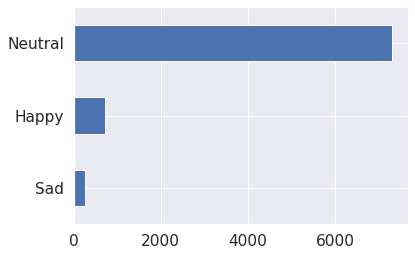

In [85]:
import seaborn as sns
sns.set(font_scale=1.4)
import matplotlib.pyplot as plt
tweets_with_hashtags['sentiment'].value_counts().plot(kind='barh').invert_yaxis()

In [55]:
tweets_with_hashtags

,sentence,sentiment
0,@PressSec sounds so defensive &amp; combative...,Sad
1,#Cheers &amp; #Happy #InternationalWomensDay f...,Happy
2,#happy #wednesday #evening with #fashion #eleg...,Happy
3,#happy #wednesday #evening with #fashion #eleg...,Happy
4,#happy #wednesday #evening with #fashion #eleg...,Happy
...,...,...
8301,@SenSanders @JoeMyGod The great divider. What...,Neutral
8302,The great divider. What a sham president. Th...,Neutral
8303,"@BraddJaffy Given her track record, #MELANIATR...",Neutral
8304,@GetSpectrum @UofDenver Such an awesome #Ameri...,Neutral


In [86]:
from tqdm import tqdm

for i in tqdm(range(len(tweets_with_hashtags))):
    tweets_with_hashtags['sentence'][i] = clean_tweet(tweets_with_hashtags['sentence'][i])

100%|██████████| 8306/8306 [00:01<00:00, 8217.89it/s]


In [87]:
tweets_with_hashtags\
.style.set_properties(**{'width': '800px'}).hide_index()  